<a href="https://colab.research.google.com/github/taoufiktalibi/1-Generative-Deep-Learning-for-Drug-Discovery/blob/main/DrugDiscovery_VAE_with_learned_prior.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In this project, I'll use variational autoencoder to generate new molecules.
Even if the training is hard in this case, I've succeded to generate new molecules using the suitable probabilistic layer within the decoder.
I also tried to use a learnable prior using a "latent" version of the dataset

In [3]:
import tensorflow as tf
#from tensorflow.keras.models import Sequential, Model
import tf_keras as tfk
import tensorflow_probability as tfp
import random
import numpy as np
tfd = tfp.distributions
tfpl = tfp.layers
tfb = tfp.bijectors

import tf_keras as tfk
tfkl = tfk.layers

from tensorflow.keras.utils import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.model_selection import train_test_split

## Preparation of data

In [4]:
DATA_PATH = "/content/alzheimersdata.txt"
data = open(DATA_PATH, 'r').read().splitlines()
new = []
count =0
for molecule in data:
    count+=1
    if 30 < len(molecule) < 50 and count < 300000:
        if ('T' not in molecule) and ('V' not in molecule) and ('g' not in molecule) and ('L' not in molecule) and ('8' not in molecule):
            new.append(molecule)

max_seq_len = len(max(new, key=len))

l = [['$']+ list(i) for i in new]
#l = [['$']+ [i] for i in new]
data = pad_sequences(l, maxlen=max_seq_len+1, padding="post", value="£",dtype=object)
print(data.shape)
# so now each smile string is 50 character long element
#data = np.expand_dims(data, -1)
type(data)

(847, 50)


numpy.ndarray

In [5]:
tokenizer = Tokenizer(num_words=None, char_level=True, lower=False)

tokenizer.fit_on_texts(data)
new_data = tokenizer.texts_to_sequences(data)
new_data = np.array(new_data)
new_data = np.expand_dims(new_data,-1)
new_data.shape

(847, 50, 1)

In [6]:
word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index)
print(f'number of words in word_index: {vocab_size}')
print(f'word_index: {word_index}')

number of words in word_index: 35
word_index: {'c': 1, '£': 2, 'C': 3, '(': 4, ')': 5, '1': 6, '2': 7, 'n': 8, 'O': 9, '3': 10, 'N': 11, '=': 12, '$': 13, '-': 14, '[': 15, ']': 16, '4': 17, 'H': 18, 'F': 19, '/': 20, 'o': 21, 'l': 22, 'S': 23, 'B': 24, 'r': 25, '@': 26, 's': 27, '#': 28, '\\': 29, '+': 30, '.': 31, '5': 32, 'I': 33, '\ufeff': 34, 'P': 35}


In [7]:
seed = 1
np.random.seed(seed)
full_train, x_test = train_test_split(np.array(new_data), test_size=0.2, random_state=seed)

x_train, x_val = train_test_split(np.array(full_train), test_size=0.1, random_state=seed)

In [8]:
x_train.shape , x_val.shape, x_test.shape

((609, 50, 1), (68, 50, 1), (170, 50, 1))

### Let's build a VAE with a simple prior : a standard gaussian

In [9]:
## Now let's build a simple VAE that encode 50 characters logn smile string into

latent_size = 20
Prior_distribution = tfd.MultivariateNormalDiag(loc=tf.zeros(latent_size, dtype=tf.float32),
                                        scale_diag=tf.ones(latent_size, dtype=tf.float32))


kl_regularizer= tfpl.KLDivergenceRegularizer(Prior_distribution,use_exact_kl = True)


In [10]:
encoder = tfk.Sequential([
        tfkl.LSTM(128, input_shape=(50,1), return_sequences=True),
        tfkl.Dropout(0.15),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(256, return_sequences=True),
        tfkl.Dropout(0.05),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(512, return_sequences=True),
        tfkl.Dropout(0.25),
        tfkl.Flatten(),
        tfkl.Dense(tfpl.MultivariateNormalTriL.params_size(latent_size)),
        tfpl.MultivariateNormalTriL(latent_size,
                                   activity_regularizer = kl_regularizer)


    ])
encoder.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50, 128)           66560     
                                                                 
 dropout (Dropout)           (None, 50, 128)           0         
                                                                 
 max_pooling1d (MaxPooling1  (None, 25, 128)           0         
 D)                                                              
                                                                 
 lstm_1 (LSTM)               (None, 25, 256)           394240    
                                                                 
 dropout_1 (Dropout)         (None, 25, 256)           0         
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 12, 256)           0         
 g1D)                                                   

In [11]:
decoder = tfk.Sequential([
    tfkl.Dense(latent_size, activation = 'relu', input_shape =(latent_size,)),
    tfkl.Reshape((latent_size,1)),
    tfkl.LSTM(512, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(256, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(128, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.Flatten(),
    tfkl.Dense(50 * (vocab_size+1)),  # Output 50 * 37 logits
    tfkl.Reshape((50, vocab_size+1)),  # Reshape to (50, 37)
    tfpl.DistributionLambda(lambda t: tfd.Independent(
        tfd.Categorical(logits=t), reinterpreted_batch_ndims=1))

])
decoder.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 20)                420       
                                                                 
 reshape (Reshape)           (None, 20, 1)             0         
                                                                 
 lstm_3 (LSTM)               (None, 20, 512)           1052672   
                                                                 
 dropout_3 (Dropout)         (None, 20, 512)           0         
                                                                 
 up_sampling1d (UpSampling1  (None, 40, 512)           0         
 D)                                                              
                                                                 
 lstm_4 (LSTM)               (None, 40, 256)           787456    
                                                      

In [12]:
vae = tfk.Model(inputs=encoder.inputs, outputs=decoder(encoder.outputs))

In [13]:
optimizer = tfk.optimizers.Adam(learning_rate=0.0005)
vae.compile(optimizer=optimizer, loss=lambda x, pred : -tf.reduce_mean(pred.log_prob(x)))

In [14]:
vae.fit(x = x_train, y = np.squeeze(x_train),validation_data = (x_val, np.squeeze(x_val)), epochs = 30)

Epoch 1/30
20/20 [==============================] - 19s 172ms/step - loss: 128.5692 - val_loss: 110.8476
Epoch 2/30
20/20 [==============================] - 1s 30ms/step - loss: 107.4957 - val_loss: 107.5916
Epoch 3/30
20/20 [==============================] - 1s 27ms/step - loss: 105.8152 - val_loss: 106.7753
Epoch 4/30
20/20 [==============================] - 1s 27ms/step - loss: 105.3445 - val_loss: 107.3814
Epoch 5/30
20/20 [==============================] - 1s 26ms/step - loss: 106.0134 - val_loss: 107.8486
Epoch 6/30
20/20 [==============================] - 1s 27ms/step - loss: 105.2235 - val_loss: 106.8020
Epoch 7/30
20/20 [==============================] - 1s 28ms/step - loss: 105.0081 - val_loss: 106.4063
Epoch 8/30
20/20 [==============================] - 1s 26ms/step - loss: 104.9096 - val_loss: 106.2815
Epoch 9/30
20/20 [==============================] - 1s 26ms/step - loss: 104.5394 - val_loss: 106.2704
Epoch 10/30
20/20 [==============================] - 1s 26ms/step - los

In [15]:
# Evaluate the model on the test set
test_loss = vae.evaluate(x_test)
print("Test loss: {}".format(test_loss))

6/6 [==============================] - 2s 8ms/step - loss: 0.0285
Test loss: 0.02846686542034149


In [16]:
#Reconstruction of example

print(data.shape)

random_number = random.randint(0, 846)
print("the initial smile string is:",''.join(data[random_number,:].tolist()))

new_data = tokenizer.texts_to_sequences(data[random_number,:])
new_data = np.expand_dims(new_data,0)
new_data.shape
q = encoder(new_data)
q
p = decoder(q.mean())


sequence = p.sample().numpy()
tokenizer.sequences_to_texts(sequence)

(847, 50)
the initial smile string is: $N#Cc1cc2c(NC(=O)C3CC3)n[nH]c2nc1-c1ccccc1££££££££


['$ O O C 1 ( c c ( 3 1 2 c n c c 3 O ( ( n c ( n 3 = c H c ( c O 3 n c C ( £ c £ £ l \\ £ £ £ £ n £ £']

In [17]:
# Generation
n_samples = 10000
samples = Prior_distribution.sample(n_samples)
output_distribution = decoder(samples)
smiles = tokenizer.sequences_to_texts(output_distribution.sample().numpy())

In [18]:
!pip install rdkit-pypi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 67.9 MB/s eta 0:00:00


In [19]:
from rdkit import Chem
def checkSMILES(smiles):
	valid_smiles = []
	for smile in smiles:
		new = ''
		for char in smile:
			if char != '$' and char != '£':
				new += char

		if Chem.MolFromSmiles(new, sanitize=False) is not None and len(new) > 15:
			valid_smiles.append(new)
			print(new)

	return valid_smiles

In [20]:
checkSMILES(smiles)

[10:52:48] SMILES Parse Error: syntax error while parsing: O O 1 c n c c 1 ( c n c c 2 c ( c c c c c ( c c C c c n C C C 2 c ) 3 c n C ) 1 )  c      
[10:52:48] SMILES Parse Error: Failed parsing SMILES ' O O 1 c n c c 1 ( c n c c 2 c ( c c c c c ( c c C c c n C C C 2 c ) 3 c n C ) 1 )  c      ' for input: ' O O 1 c n c c 1 ( c n c c 2 c ( c c c c c ( c c C c c n C C C 2 c ) 3 c n C ) 1 )  c      '
[10:52:48] SMILES Parse Error: syntax error while parsing: C O C @ C c c / ( 2 C 2 c c c C n n ( c c C 1 1 3 c c 2 C 2 c C ) ) n 2 O C ) C   (  =  1  
[10:52:48] SMILES Parse Error: Failed parsing SMILES ' C O C @ C c c / ( 2 C 2 c c c C n n ( c c C 1 1 3 c c 2 C 2 c C ) ) n 2 O C ) C   (  =  1  ' for input: ' C O C @ C c c / ( 2 C 2 c c c C n n ( c c C 1 1 3 c c 2 C 2 c C ) ) n 2 O C ) C   (  =  1  '
[10:52:48] SMILES Parse Error: syntax error while parsing: O O c N C C 1 = 2 N n n n c c 3 c n c c c N c 3 c 1 c n ) - 4 1 - C n c c c C c   C c  C   
[10:52:48] SMILES Parse Error: Failed pars

F N N c c N N = 1 c [ c c c c c c c H c N ) C c 3 ) c 1 c 3 ( c 2 1 ) 1 c O c O  n O  c     


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[10:52:49] SMILES Parse Error: syntax error while parsing: O = C c c c ( C c ) c 1 C C ) - ( ( c ) 3 c 3 c n 3 C C C c 1 c c c 2 c O 3 )    ] ) )    
[10:52:49] SMILES Parse Error: Failed parsing SMILES ' O = C c c c ( C c ) c 1 C C ) - ( ( c ) 3 c 3 c n 3 C C C c 1 c c c 2 c O 3 )    ] ) )    ' for input: ' O = C c c c ( C c ) c 1 C C ) - ( ( c ) 3 c 3 c n 3 C C C c 1 c c c 2 c O 3 )    ] ) )    '
[10:52:49] SMILES Parse Error: syntax error while parsing: O ( 1 ( c C c 1 [ c c o c ( ) c c c n C 2 3 2 C c c c n = N c 3 c ( s ) c ) c c C 1 )     1 C
[10:52:49] SMILES Parse Error: Failed parsing SMILES ' O ( 1 ( c C c 1 [ c c o c ( ) c c c n C 2 3 2 C c c c n = N c 3 c ( s ) c ) c c C 1 )     1 C' for input: ' O ( 1 ( c C c 1 [ c c o c ( ) c c c n C 2 3 2 C c c c n = N c 3 c ( s ) c ) c c C 1 )     1 C'
[10:52:49] SMILES Parse Error: syntax error while parsing: O = C ( c N ( c 3 c C C c c C C c c n ) c c c 1 2 

n C = C c ) c c c O c H n c = O c c - n 3 4 ) c c c c n c c ) - )  c = ) c N  c   c o    1 


[10:52:50] SMILES Parse Error: syntax error while parsing: C C c 1 c 2 C 1 c 1 C n N c c 2 c c c c N c c 2 c c n C 2 ) [ O n = c c O  c  @ n    1 1 1 
[10:52:50] SMILES Parse Error: Failed parsing SMILES ' C C c 1 c 2 C 1 c 1 C n N c c 2 c c c c N c c 2 c c n C 2 ) [ O n = c c O  c  @ n    1 1 1 ' for input: ' C C c 1 c 2 C 1 c 1 C n N c c 2 c c c c N c c 2 c c n C 2 ) [ O n = c c O  c  @ n    1 1 1 '
[10:52:50] SMILES Parse Error: syntax error while parsing: C O 1 1 c C c 1 [ c C ( n c N 2 c c n [ C - 3 ( ( 1 c C c C ) c c 2 n ) ) )  1 n    c    
[10:52:50] SMILES Parse Error: Failed parsing SMILES ' C O 1 1 c C c 1 [ c C ( n c N 2 c c n [ C - 3 ( ( 1 c C c C ) c c 2 n ) ) )  1 n    c    ' for input: ' C O 1 1 c C c 1 [ c C ( n c N 2 c c n [ C - 3 ( ( 1 c C c C ) c c 2 n ) ) )  1 n    c    '
[10:52:50] SMILES Parse Error: syntax error while parsing: C c . 1 O c C ) N [ c ( 1 ( - \ 1 n n 3 ] ) c O O 3 c ( ( c c = F c 2 1 ) ) ( c = s  2 C    
[10:52:50] SMILES Parse Error: Failed parsin

P C c 1 1 c c - c c N O n n c ] c c ) c c ( ) c 3 c c 1 [ O ) 4 ) c c 2 ) c c n C c  C      


[10:52:50] SMILES Parse Error: syntax error while parsing: C O 1 F c c c ) 2 ) C 2 c C c - c = n c 3 c ( 2 2 3 c c C c 1 2 c c C n ) c ) )  O   o    
[10:52:50] SMILES Parse Error: Failed parsing SMILES ' C O 1 F c c c ) 2 ) C 2 c C c - c = n c 3 c ( 2 2 3 c c C c 1 2 c c C n ) c ) )  O   o    ' for input: ' C O 1 F c c c ) 2 ) C 2 c C c - c = n c 3 c ( 2 2 3 c c C c 1 2 c c C n ) c ) )  O   o    '
[10:52:50] SMILES Parse Error: syntax error while parsing: C O C 1 c c C ( c c ( c N 2 n 1 c c 3 c ) c C 1 c ) ) = c c - c [ c C c H =  3 = O   (    
[10:52:50] SMILES Parse Error: Failed parsing SMILES ' C O C 1 c c C ( c c ( c N 2 n 1 c c 3 c ) c C 1 c ) ) = c c - c [ c C c H =  3 = O   (    ' for input: ' C O C 1 c c C ( c c ( c N 2 n 1 c c 3 c ) c C 1 c ) ) = c c - c [ c C c H =  3 = O   (    '
[10:52:50] SMILES Parse Error: syntax error while parsing: C r C 1 N c - = c c O c [ c c 2 c c ( c C n l ( 1 ( c = c c 2 c C 1 4 ) c c C  1  2  n    
[10:52:50] SMILES Parse Error: Failed parsing 

n C = C c @ c = 1 N C c C ) n ( N ( n c n [ l c c = = O C 4 ( c l 2 ( C N c   2 n c 1  C    


[10:52:51] SMILES Parse Error: Failed parsing SMILES ' C O C ( c c c C C - n C ( 2 ( c 2 n c n ) ( C 4 c c ) c O ) c ( c ( c c C N 2 2 c )   [   1 ' for input: ' C O C ( c c c C C - n C ( 2 ( c 2 n c n ) ( C 4 c c ) c O ) c ( c ( c c C N 2 2 c )   [   1 '
[10:52:51] SMILES Parse Error: syntax error while parsing: C C C c ( O ( 2 c c H c ( n 2 c n c O 5 N ( 2 c n O c n 3 1 ( 1 c 3 ) ) c O   c 2 = C )    
[10:52:51] SMILES Parse Error: Failed parsing SMILES ' C C C c ( O ( 2 c c H c ( n 2 c n c O 5 N ( 2 c n O c n 3 1 ( 1 c 3 ) ) c O   c 2 = C )    ' for input: ' C C C c ( O ( 2 c c H c ( n 2 c n c O 5 N ( 2 c n O c n 3 1 ( 1 c 3 ) ) c O   c 2 = C )    '
[10:52:51] SMILES Parse Error: syntax error while parsing: C c C 1 c = ] ( - n B c c n c 2 ( C c c N 3 S 3 1 c O c n c c ( c ) H C  = N 1 c )   )    
[10:52:51] SMILES Parse Error: Failed parsing SMILES ' C c C 1 c = ] ( - n B c c n c 2 ( C c c N 3 S 3 1 c O c n c c ( c ) H C  = N 1 c )   )    ' for input: ' C c C 1 c = ] ( - n B c c n c

['F N N c c N N = 1 c [ c c c c c c c H c N ) C c 3 ) c 1 c 3 ( c 2 1 ) 1 c O c O  n O  c     ',
 'n C = C c ) c c c O c H n c = O c c - n 3 4 ) c c c c n c c ) - )  c = ) c N  c   c o    1 ',
 'P C c 1 1 c c - c c N O n n c ] c c ) c c ( ) c 3 c c 1 [ O ) 4 ) c c 2 ) c c n C c  C      ',
 'n C = C c @ c = 1 N C c C ) n ( N ( n c n [ l c c = = O C 4 ( c l 2 ( C N c   2 n c 1  C    ']

### the result was not satisfactory, we got just 4 corrected molecules out of 10000 samples from the prior

### Let's modify the regularizer to boost the quality of training
#### we'll weight KL divergence term by a small weight (0.01) to boost training the decoder, and also we'll not compute the exact KL divergence term,
#### instead we'll use monte carlo estimation

In [21]:
kl_regularizer1= tfpl.KLDivergenceRegularizer(Prior_distribution,
                                                          weight = 0.01,
                                                          use_exact_kl = False, # using analytical formula leads to
                                                          test_points_fn = lambda q :q.sample(3),
                                                          test_points_reduce_axis = None) #None : all axis are averaged

In [22]:
encoder1 = tfk.Sequential([
        tfkl.LSTM(128, input_shape=(50,1), return_sequences=True),
        tfkl.Dropout(0.15),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(256, return_sequences=True),
        tfkl.Dropout(0.05),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(512, return_sequences=True),
        tfkl.Dropout(0.25),
        tfkl.Flatten(),
        tfkl.Dense(tfpl.MultivariateNormalTriL.params_size(latent_size)),
        tfpl.MultivariateNormalTriL(latent_size,
                                   activity_regularizer = kl_regularizer1)


    ])
encoder1.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 50, 128)           66560     
                                                                 
 dropout_6 (Dropout)         (None, 50, 128)           0         
                                                                 
 max_pooling1d_2 (MaxPoolin  (None, 25, 128)           0         
 g1D)                                                            
                                                                 
 lstm_7 (LSTM)               (None, 25, 256)           394240    
                                                                 
 dropout_7 (Dropout)         (None, 25, 256)           0         
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 12, 256)           0         
 g1D)                                                 

In [23]:
decoder1 = tfk.Sequential([
    tfkl.Dense(latent_size, activation = 'relu', input_shape =(latent_size,)),
    tfkl.Reshape((latent_size,1)),
    tfkl.LSTM(512, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(256, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(128, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.Flatten(),
    tfkl.Dense(50 * (vocab_size+1)),  # Output 50 * 37 logits
    tfkl.Reshape((50, vocab_size+1)),  # Reshape to (50, 37)
    tfpl.DistributionLambda(lambda t: tfd.Independent(
        tfd.Categorical(logits=t), reinterpreted_batch_ndims=1))

])
decoder1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 20)                420       
                                                                 
 reshape_2 (Reshape)         (None, 20, 1)             0         
                                                                 
 lstm_9 (LSTM)               (None, 20, 512)           1052672   
                                                                 
 dropout_9 (Dropout)         (None, 20, 512)           0         
                                                                 
 up_sampling1d_2 (UpSamplin  (None, 40, 512)           0         
 g1D)                                                            
                                                                 
 lstm_10 (LSTM)              (None, 40, 256)           787456    
                                                      

In [24]:
vae1 = tfk.Model(inputs=encoder1.inputs, outputs=decoder1(encoder1.outputs))

In [25]:
optimizer = tfk.optimizers.Adam(learning_rate=0.0005)
vae1.compile(optimizer=optimizer, loss=lambda x, pred : -tf.reduce_mean(pred.log_prob(x)))

In [26]:
#vae.fit(x = x_train, y = x_train,validation_data = (x_val,x_val), epochs = 1)
vae1.fit(x = x_train, y = np.squeeze(x_train),validation_data = (x_val, np.squeeze(x_val)), epochs = 30)

Epoch 1/30
20/20 [==============================] - 26s 179ms/step - loss: 126.1262 - val_loss: 108.6255
Epoch 2/30
20/20 [==============================] - 1s 32ms/step - loss: 106.9931 - val_loss: 108.4974
Epoch 3/30
20/20 [==============================] - 1s 30ms/step - loss: 105.9861 - val_loss: 108.1976
Epoch 4/30
20/20 [==============================] - 1s 27ms/step - loss: 105.7612 - val_loss: 106.5661
Epoch 5/30
20/20 [==============================] - 1s 28ms/step - loss: 105.0301 - val_loss: 107.0127
Epoch 6/30
20/20 [==============================] - 1s 27ms/step - loss: 105.2143 - val_loss: 106.9820
Epoch 7/30
20/20 [==============================] - 1s 28ms/step - loss: 105.2707 - val_loss: 106.4615
Epoch 8/30
20/20 [==============================] - 1s 27ms/step - loss: 104.8412 - val_loss: 106.3507
Epoch 9/30
20/20 [==============================] - 1s 28ms/step - loss: 104.6815 - val_loss: 106.3240
Epoch 10/30
20/20 [==============================] - 1s 28ms/step - los

In [27]:
# Evaluate the model on the test set
test_loss = vae1.evaluate(x_test)
print("Test loss: {}".format(test_loss))

6/6 [==============================] - 3s 8ms/step - loss: 0.0360
Test loss: 0.03603203222155571


### Reconstruction of some examples

In [28]:
print(data.shape)

random_number = random.randint(0, 846)
print("the initial smile string is:",''.join(data[random_number,:].tolist()))

new_data = tokenizer.texts_to_sequences(data[random_number,:])
new_data = np.expand_dims(new_data,0)
new_data.shape
q = encoder1(new_data)
print("the learned surrogate posterior is:", q.tensor_distribution)
p = decoder1(q.mean())
print("the learned p(x/z):", p.tensor_distribution)

sequence = p.sample().numpy()
tokenizer.sequences_to_texts(sequence)

(847, 50)
the initial smile string is: $COc1ccc(OC)c(C2=C(c3cn(C)c4ccccc34)C(=O)NC2=O)c1£
the learned surrogate posterior is: tfp.distributions.MultivariateNormalTriL("MultivariateNormalTriL", batch_shape=[1], event_shape=[20], dtype=float32)
the learned p(x/z): tfp.distributions.Independent("IndependentCategorical", batch_shape=[1], event_shape=[50], dtype=int32)


['$ C O c ( ) ( C 2 C = C N 1 ( ( n ) n c c ( O 3 c o N n 5 C ) n c c 2 = n c C ) F O 2 [ c £ £ £ £ £']

In [29]:
# Generation

samples = Prior_distribution.sample(n_samples)
output_distribution = decoder1(samples)
smiles = tokenizer.sequences_to_texts(output_distribution.sample().numpy())


In [30]:
checkSMILES(smiles)

[10:54:06] SMILES Parse Error: syntax error while parsing: C n c = c c c = c 2 = = 3 ( c c O 1 n c 3 c 4 c ) c 3 ) n ) c O n ] O o 3 C 1 ( 2 O ) H C    
[10:54:06] SMILES Parse Error: Failed parsing SMILES ' C n c = c c c = c 2 = = 3 ( c c O 1 n c 3 c 4 c ) c 3 ) n ) c O n ] O o 3 C 1 ( 2 O ) H C    ' for input: ' C n c = c c c = c 2 = = 3 ( c c O 1 n c 3 c 4 c ) c 3 ) n ) c O n ] O o 3 C 1 ( 2 O ) H C    '
[10:54:06] SMILES Parse Error: syntax error while parsing: C O c c c c c c = C C = n C o ( C C N c c c 3 4 c n 3 1 ] ( ( ( = 3 O c O O = 2 ) 1   c C 1 2 1
[10:54:06] SMILES Parse Error: Failed parsing SMILES ' C O c c c c c c = C C = n C o ( C C N c c c 3 4 c n 3 1 ] ( ( ( = 3 O c O O = 2 ) 1   c C 1 2 1' for input: ' C O c c c c c c = C C = n C o ( C C N c c c 3 4 c n 3 1 ] ( ( ( = 3 O c O O = 2 ) 1   c C 1 2 1'
[10:54:06] SMILES Parse Error: syntax error while parsing: C O 1 ( c c C ( 1 C c ( 3 N = c c O n ) O c 3 n ( ) 4 c O ) = S ) c O n ) c ] O = F 2 2 = n O C l
[10:54:06] SMIL

I C O O 1 c c ( 2 n ) ( ( c ( ( 3 4 n c c ( c 3 c - 2 C ) + n ) C ( C C C ) 2 4 ) 3 c c 1 )    


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[10:54:07] SMILES Parse Error: Failed parsing SMILES ' C O 1 c c ( F ( c c ( ( 3 C ( n c ) - H 2 4 C c ] 4 H = O / c O 2 c ( ) 3 c O ) = ) C 3 = ) o  ' for input: ' C O 1 c c ( F ( c c ( ( 3 C ( n c ) - H 2 4 C c ] 4 H = O / c O 2 c ( ) 3 c O ) = ) C 3 = ) o  '
[10:54:07] SMILES Parse Error: syntax error while parsing: C C . c c 2 c c ( n C C ( ( c ( c N = C c ) 2 ( ( - c c c ( 4 4 F = O ) 3 3 ) C c 1 ) ) 1    
[10:54:07] SMILES Parse Error: Failed parsing SMILES ' C C . c c 2 c c ( n C C ( ( c ( c N = C c ) 2 ( ( - c c c ( 4 4 F = O ) 3 3 ) C c 1 ) ) 1    ' for input: ' C C . c c 2 c c ( n C C ( ( c ( c N = C c ) 2 ( ( - c c c ( 4 4 F = O ) 3 3 ) C c 1 ) ) 1    '
[10:54:07] SMILES Parse Error: syntax error while parsing: C O c 1 n c c ( c N = ( = n c 3 ( c N 2 - = c ) 1 C c N C = F C H O c c C C c ( ) ) )   ) 2  
[10:54:07] SMILES Parse Error: Failed parsing SMILES ' C O c 1 n c c ( c N = ( = n c 3 ( c N 2 -

s C O c c c c c c C 2 c c C c 3 1 c C n c = ( ( 2 ) c H c C c ] N c 3 = ) c c 1 c ) F c H c    
F C = ( 1 C ) C c c - c = c C c c c c n l C - C 4 c S ( ) ( n n l n = ( ) c ) c ) 3 2 B ) 1 c  c 


[10:54:08] SMILES Parse Error: Failed parsing SMILES ' C c 1 c c C ( c ( C c N c c ( n 3 3 ( c 3 ( ) n / n c ( c N c c 2 c ] ( F c c c ) F n ) )  O  1' for input: ' C c 1 c c C ( c ( C c N c c ( n 3 3 ( c 3 ( ) n / n c ( c N c c 2 c ] ( F c c c ) F n ) )  O  1'
[10:54:08] SMILES Parse Error: syntax error while parsing: C c c c c c C - = ( 2 = 1 N c c N c 2 c ( l C c - C 3 = c n 2 3 2 2 r o ( ) ) H c C 1 2   )  1
[10:54:08] SMILES Parse Error: Failed parsing SMILES ' C c c c c c C - = ( 2 = 1 N c c N c 2 c ( l C c - C 3 = c n 2 3 2 2 r o ( ) ) H c C 1 2   )  1' for input: ' C c c c c c C - = ( 2 = 1 N c c N c 2 c ( l C c - C 3 = c n 2 3 2 2 r o ( ) ) H c C 1 2   )  1'
[10:54:08] SMILES Parse Error: syntax error while parsing: C O 1 n c c ( 2 c C c C n N - c c c n 1 c 2 3 C c c ) ) c C ) O n c 4 c n O c ) c c  c c    
[10:54:08] SMILES Parse Error: Failed parsing SMILES ' C O 1 n c c ( 2 c C c C n N - c c c n 1 c 2 3 C c c ) ) c C ) O n c 4 c n O c ) c c  c c    ' for input: ' C O 1 n c 

c C n 1 c O C 1 ( = C ( c C c c O N ] C ( c = c C C c 3 [ c = F C C ) / c = N C ) 2 4 F F n c   
F C C 1 c N c 2 - c C 1 - c ( S \ ( c 2 ( l c ) c C 3 c - c c C ) c = c o B c 2 c [ c 1 3 C c  C 1


[10:54:08] SMILES Parse Error: syntax error while parsing: C O C 1 n c c c c ( 2 c - ( c ( c [ N / ( c C / C c ( ) ) N N C n c ) 2 O 3 C ) ) c c   c .  
[10:54:08] SMILES Parse Error: Failed parsing SMILES ' C O C 1 n c c c c ( 2 c - ( c ( c [ N / ( c C / C c ( ) ) N N C n c ) 2 O 3 C ) ) c c   c .  ' for input: ' C O C 1 n c c c c ( 2 c - ( c ( c [ N / ( c C / C c ( ) ) N N C n c ) 2 O 3 C ) ) c c   c .  '
[10:54:08] SMILES Parse Error: syntax error while parsing: O n 1 1 c ) c 2 c c c ( C C c 2 ) = = ( ) c C ] n 4 3 = C H c - ) n n c c c O c ) c C    .  1
[10:54:08] SMILES Parse Error: Failed parsing SMILES ' O n 1 1 c ) c 2 c c c ( C C c 2 ) = = ( ) c C ] n 4 3 = C H c - ) n n c c c O c ) c C    .  1' for input: ' O n 1 1 c ) c 2 c c c ( C C c 2 ) = = ( ) c C ] n 4 3 = C H c - ) n n c c c O c ) c C    .  1'
[10:54:08] SMILES Parse Error: syntax error while parsing: C O c 1 c ( c c 2 C = ( C c 3 c ( c 3 / ( 4 c = c N 3 = C c ( = ) 2 r ) c ) c 2 N c c c c c c  l
[10:54:08] SMILES Pars

['I C O O 1 c c ( 2 n ) ( ( c ( ( 3 4 n c c ( c 3 c - 2 C ) + n ) C ( C C C ) 2 4 ) 3 c c 1 )    ',
 's C O c c c c c c C 2 c c C c 3 1 c C n c = ( ( 2 ) c H c C c ] N c 3 = ) c c 1 c ) F c H c    ',
 'F C = ( 1 C ) C c c - c = c C c c c c n l C - C 4 c S ( ) ( n n l n = ( ) c ) c ) 3 2 B ) 1 c  c ',
 'c C n 1 c O C 1 ( = C ( c C c c O N ] C ( c = c C C c 3 [ c = F C C ) / c = N C ) 2 4 F F n c   ',
 'F C C 1 c N c 2 - c C 1 - c ( S \\ ( c 2 ( l c ) c C 3 c - c c C ) c = c o B c 2 c [ c 1 3 C c  C 1']

### We correctly generated 5 molecules

### Now let's try to learn a better prior describing latent variables of the dataset.

#### First we'll use an autoencoder to produce a latent version (10 dimensional elements) of the dataset

#### then we train a mixture of gaussian on the latent dataset by maximising the log-likelihood, The resulting mixture will be used as prior in the next VAE

In [31]:

encoder = tfk.Sequential([
    tfkl.Flatten(input_shape = (50,1)),
    tfkl.Dense(40, activation = 'sigmoid'),
    tfkl.Dense(20, activation = 'sigmoid'),
    tfkl.Dense(latent_size, activation = 'sigmoid')
])

decoder = tfk.Sequential([
    tfkl.Dense(20, activation = 'sigmoid', input_shape = (latent_size,)),
    tfkl.Dense(40, activation = 'sigmoid'),
    tfkl.Dense(50, activation = 'sigmoid'),
    tfkl.Reshape((50,1))
])

autoencoder = tfk.Model(inputs = encoder.input, outputs = decoder(encoder.output))
X_train = np.concatenate((x_train, x_val, x_test), axis=0)
autoencoder.compile(loss = 'mse', optimizer = 'sgd')
history = autoencoder.fit(X_train,X_train, epochs = 300)

Epoch 1/300
27/27 [==============================] - 2s 3ms/step - loss: 54.2131
Epoch 2/300
27/27 [==============================] - 0s 3ms/step - loss: 53.7801
Epoch 3/300
27/27 [==============================] - 0s 3ms/step - loss: 53.3666
Epoch 4/300
27/27 [==============================] - 0s 3ms/step - loss: 52.9816
Epoch 5/300
27/27 [==============================] - 0s 3ms/step - loss: 52.6275
Epoch 6/300
27/27 [==============================] - 0s 3ms/step - loss: 52.3053
Epoch 7/300
27/27 [==============================] - 0s 3ms/step - loss: 52.0146
Epoch 8/300
27/27 [==============================] - 0s 4ms/step - loss: 51.7546
Epoch 9/300
27/27 [==============================] - 0s 3ms/step - loss: 51.5239
Epoch 10/300
27/27 [==============================] - 0s 4ms/step - loss: 51.3202
Epoch 11/300
27/27 [==============================] - 0s 3ms/step - loss: 51.1414
Epoch 12/300
27/27 [==============================] - 0s 3ms/step - loss: 50.9848
Epoch 13/300
27/27 [=====

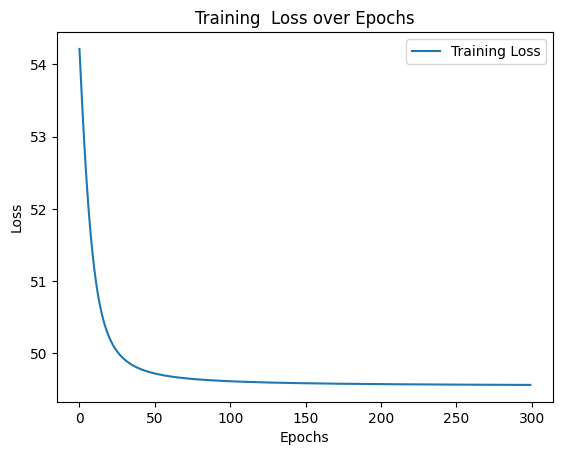

In [32]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training  Loss over Epochs')
plt.legend()
plt.show()

So no need to train further this autoencoder as the training loss curve stagnated

In [33]:
latent_data = encoder(x_train)
latent_data.shape

TensorShape([609, 20])

In [34]:
### let's create a trainable mixture of guassian

num_modes = 2


logits = tf.Variable(tf.zeros([num_modes]), name='logits')
mixture_distribution = tfd.Categorical(logits=logits)
loc = tf.Variable(tf.random.normal([num_modes,latent_size]), name = 'loc')
scale_diag = tfp.util.TransformedVariable(tf.Variable(tf.ones([num_modes,latent_size])),bijector = tfb.Softplus(), name = 'scale')
components_distribution=tfd.MultivariateNormalDiag(loc = loc, scale_diag = scale_diag)

prior = tfd.MixtureSameFamily(
                               mixture_distribution = mixture_distribution,
                               components_distribution = components_distribution
                             )

In [35]:
trainable_params = prior.trainable_variables
for param in trainable_params:
    print(f'Parameter name: {param.name}, shape: {param.shape}')

print(f'Total number of trainable parameters: {sum(tf.size(param).numpy() for param in trainable_params)}')

Parameter name: loc:0, shape: (2, 20)
Parameter name: scale:0, shape: (2, 20)
Parameter name: logits:0, shape: (2,)
Total number of trainable parameters: 82


In [36]:
# training the new prior with the latent dataset

num_epochs = 10
opt = tf.keras.optimizers.Adam()
train_losses = []

for epoch in range(num_epochs):
    #print("Epoch {}...".format(epoch))
    train_loss = tf.keras.metrics.Mean()
    for train in latent_data:
        with tf.GradientTape() as tape:
            tape.watch(prior.trainable_variables)
            loss = -prior.log_prob(train)
        train_loss(loss)
        grads = tape.gradient(loss, prior.trainable_variables)
        opt.apply_gradients(zip(grads, prior.trainable_variables))

    print(f"Epoch : {epoch}.....Loss : {train_loss.result().numpy()}")
    train_losses.append(train_loss.result().numpy())

Epoch : 0.....Loss : 20.155611038208008
Epoch : 1.....Loss : 1.740491509437561
Epoch : 2.....Loss : -12.532805442810059
Epoch : 3.....Loss : -25.206619262695312
Epoch : 4.....Loss : -36.04194259643555
Epoch : 5.....Loss : -43.187652587890625
Epoch : 6.....Loss : -46.1835823059082
Epoch : 7.....Loss : -47.07476043701172
Epoch : 8.....Loss : -47.319358825683594
Epoch : 9.....Loss : -47.37623596191406


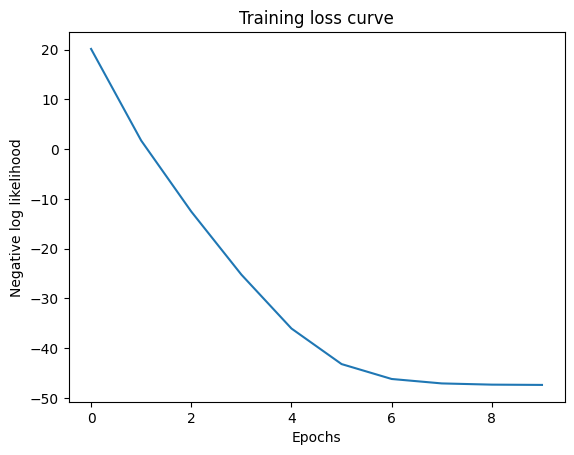

In [37]:
plt.plot(train_losses)
plt.xlabel("Epochs")
plt.ylabel("Negative log likelihood")
plt.title("Training loss curve")
plt.show()

Here also we don't need more epochs for training

In [38]:
prior.trainable_variables

(<tf.Variable 'loc:0' shape=(2, 20) dtype=float32, numpy=
 array([[ 0.5331565 ,  0.5552353 ,  0.55692476,  0.55786765,  0.6462119 ,
          0.61127216,  0.60129   ,  0.3664743 ,  0.6519073 ,  0.5758191 ,
          0.5080649 ,  0.5329904 ,  0.4536508 ,  0.51071465,  0.645217  ,
          0.5712884 ,  0.45199898,  0.5136984 ,  0.43523878,  0.54723895],
        [ 1.3948735 ,  0.5223279 ,  0.107801  ,  0.5552357 ,  0.34138778,
          0.6405634 , -1.1278765 ,  0.31463763, -0.8708171 , -0.3634919 ,
          0.6661398 ,  0.00193197,  0.44878206, -0.5257051 ,  0.9027885 ,
          1.4111468 ,  0.46411508, -1.3809671 ,  0.43655682,  1.2075928 ]],
       dtype=float32)>,
 <tf.Variable 'scale:0' shape=(2, 20) dtype=float32, numpy=
 array([[-3.7216544 , -3.8567336 , -3.6251976 , -3.6587818 , -3.704793  ,
         -3.945937  , -3.7994566 , -3.753151  , -3.852167  , -3.6490173 ,
         -3.784643  , -3.5410023 , -3.8397806 , -3.857447  , -4.055173  ,
         -3.5472596 , -3.6179    , -3.793

In [39]:
kl_regularizer2= tfpl.KLDivergenceRegularizer(prior,
                                              use_exact_kl = False,
                                              weight = 0.01,
                                              test_points_fn = lambda q :q.sample(3),
                                              test_points_reduce_axis = None) #None : all axis are averaged

In [40]:

encoder2 = tfk.Sequential([
        tfkl.LSTM(128, input_shape=(50,1), return_sequences=True),
        tfkl.Dropout(0.15),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(256, return_sequences=True),
        tfkl.Dropout(0.05),
        tfkl.MaxPooling1D(pool_size=2),
        tfkl.LSTM(512, return_sequences=True),
        tfkl.Dropout(0.25),
        tfkl.Flatten(),
        tfkl.Dense(tfpl.MultivariateNormalTriL.params_size(latent_size)),
        tfpl.MultivariateNormalTriL(latent_size,
                                   activity_regularizer = kl_regularizer2)


    ])
encoder2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 50, 128)           66560     
                                                                 
 dropout_12 (Dropout)        (None, 50, 128)           0         
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 25, 128)           0         
 g1D)                                                            
                                                                 
 lstm_13 (LSTM)              (None, 25, 256)           394240    
                                                                 
 dropout_13 (Dropout)        (None, 25, 256)           0         
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 12, 256)           0         
 g1D)                                                 

In [41]:
decoder2 = tfk.Sequential([
    tfkl.Dense(latent_size, activation = 'relu', input_shape =(latent_size,)),
    tfkl.Reshape((latent_size,1)),
    tfkl.LSTM(512, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(256, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.UpSampling1D(size = 2),
    tfkl.LSTM(128, return_sequences=True),
    tfkl.Dropout(0.05),
    tfkl.Flatten(),
    tfkl.Dense(50 * (vocab_size+1)),  # Output 50 * 37 logits
    tfkl.Reshape((50, vocab_size+1)),  # Reshape to (50, 37)
    tfpl.DistributionLambda(lambda t: tfd.Independent(
        tfd.Categorical(logits=t), reinterpreted_batch_ndims=1))

])
decoder2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 20)                420       
                                                                 
 reshape_5 (Reshape)         (None, 20, 1)             0         
                                                                 
 lstm_15 (LSTM)              (None, 20, 512)           1052672   
                                                                 
 dropout_15 (Dropout)        (None, 20, 512)           0         
                                                                 
 up_sampling1d_4 (UpSamplin  (None, 40, 512)           0         
 g1D)                                                            
                                                                 
 lstm_16 (LSTM)              (None, 40, 256)           787456    
                                                      

In [42]:
vae2 = tfk.Model(inputs=encoder2.inputs, outputs=decoder2(encoder2.outputs))

In [43]:
optimizer = tfk.optimizers.Adam(learning_rate=0.0005)
vae2.compile(optimizer=optimizer, loss=lambda x, pred : -tf.reduce_mean(pred.log_prob(x)))

In [44]:
vae2.fit(x = x_train, y = np.squeeze(x_train),validation_data = (x_val, np.squeeze(x_val)), epochs = 30)

Epoch 1/30
20/20 [==============================] - 17s 185ms/step - loss: 126.8616 - val_loss: 108.9029
Epoch 2/30
20/20 [==============================] - 1s 32ms/step - loss: 107.0152 - val_loss: 107.3175
Epoch 3/30
20/20 [==============================] - 1s 31ms/step - loss: 105.6946 - val_loss: 107.7380
Epoch 4/30
20/20 [==============================] - 1s 28ms/step - loss: 105.8199 - val_loss: 106.8388
Epoch 5/30
20/20 [==============================] - 1s 29ms/step - loss: 105.0566 - val_loss: 106.8869
Epoch 6/30
20/20 [==============================] - 1s 31ms/step - loss: 105.4093 - val_loss: 106.4640
Epoch 7/30
20/20 [==============================] - 1s 38ms/step - loss: 104.8649 - val_loss: 106.2547
Epoch 8/30
20/20 [==============================] - 1s 37ms/step - loss: 104.7940 - val_loss: 106.4226
Epoch 9/30
20/20 [==============================] - 1s 40ms/step - loss: 104.7605 - val_loss: 106.3892
Epoch 10/30
20/20 [==============================] - 1s 35ms/step - los

### the overall loss has decreased using the learned prior, hoping that we'll generate more molecules

In [45]:
# Evaluate the model on the test set
test_loss = vae2.evaluate(x_test)
print("Test loss: {}".format(test_loss))

6/6 [==============================] - 3s 9ms/step - loss: 0.0949
Test loss: 0.09487263113260269


In [46]:
#Reconstruction of example

print(data.shape)

random_number = random.randint(0, 846)
print("the initial smile string is:",''.join(data[random_number,:].tolist()))

new_data = tokenizer.texts_to_sequences(data[random_number,:])
new_data = np.expand_dims(new_data,0)
new_data.shape
q = encoder2(new_data)
q
p = decoder2(q.mean())


sequence = p.sample().numpy()
tokenizer.sequences_to_texts(sequence)

(847, 50)
the initial smile string is: $COCCn1cc(-c2ccnc(Nc3ccccc3)n2)c2ccccc21££££££££££


['$ C C c 1 c c c ( 3 c c C c ] 3 c c c ( O N c n ) ) 2 C ) F O ) c C c 3 1 ) 1 £ £ £ £ £ £ £ £ £ £ £']

In [47]:
# Generation
samples = prior.sample(n_samples)
output_distribution = decoder2(samples)
smiles = tokenizer.sequences_to_texts(output_distribution.sample().numpy())

In [48]:
checkSMILES(smiles)

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
[11:01:24] SMILES Parse Error: syntax error while parsing: C n C F ) C C c C [ O O s c c O 4 c n n c c ) c = O n n 3 ( 3 C c ) ( S / ( ) ) O 1 c ] c c 1 ] C
[11:01:24] SMILES Parse Error: Failed parsing SMILES ' C n C F ) C C c C [ O O s c c O 4 c n n c c ) c = O n n 3 ( 3 C c ) ( S / ( ) ) O 1 c ] c c 1 ] C' for input: ' C n C F ) C C c C [ O O s c c O 4 c n n c c ) c = O n n 3 ( 3 C c ) ( S / ( ) ) O 1 c ] c c 1 ] C'
[11:01:24] SMILES Parse Error: syntax error while parsing: C n ( 1 C 1 N c ) C c n c @ H C N c 2 H 3 ) ] ) c l 3 N 1 ( - n - = B ) c = ) c F c ( ) c c c  1
[11:01:24] SMILES Parse Error: Failed parsing SMILES ' C n ( 1 C 1 N c ) C c n c @ H C N c 2 H 3 ) ] ) c l 3 N 1 ( - n - = B ) c = ) c F c ( ) c c c  1' for input: ' C n ( 1 C 1 N c ) C c n c @ H C N c 2 H 3 ) ] ) c l 3 N 1 ( - n - = B ) c = ) c F c ( ) c c c  1'
[11:01:24] SMILES Parse Error: syntax error while parsing: C C 1 C 1 c O C N c 

o C c N C c ( 2 / C c C c C c 2 C 4 2 c c N C n n ( c 3 = c - ) n 4 c 5 3 ( ) ) ) 4 3 c  [  o  


[11:01:25] SMILES Parse Error: syntax error while parsing: C n c ( n = C ( N ) O N ] n N C H = [ O c n n 3 ) @ = + n c 3 - 4 ( n 3 / 2 4 ) [ c ) = c 1  F C
[11:01:25] SMILES Parse Error: Failed parsing SMILES ' C n c ( n = C ( N ) O N ] n N C H = [ O c n n 3 ) @ = + n c 3 - 4 ( n 3 / 2 4 ) [ c ) = c 1  F C' for input: ' C n c ( n = C ( N ) O N ] n N C H = [ O c n n 3 ) @ = + n c 3 - 4 ( n 3 / 2 4 ) [ c ) = c 1  F C'
[11:01:25] SMILES Parse Error: syntax error while parsing: c n C ( ( ( ( ( 2 - O ( ( c 3 ( c [ n l [ ) C ) ( n S H c ( \ c c n c O n c 4 ) n ) 1 ] ) 1 c N 
[11:01:25] SMILES Parse Error: Failed parsing SMILES ' c n C ( ( ( ( ( 2 - O ( ( c 3 ( c [ n l [ ) C ) ( n S H c ( \ c c n c O n c 4 ) n ) 1 ] ) 1 c N ' for input: ' c n C ( ( ( ( ( 2 - O ( ( c 3 ( c [ n l [ ) C ) ( n S H c ( \ c c n c O n c 4 ) n ) 1 ] ) 1 c N '
[11:01:25] SMILES Parse Error: syntax error while parsing: C C c c 1 = c C 2 S C O O n C 1 3 [ [ N ] ] 2 ] O n c @ n ( - ( n c C O n 3 c ) c c 1 O 1 c 2 l 1
[11

O N = 1 ( 1 C C c @ - c c C c C - \ = 2 ) N c C c C @ / c c ( 4 c ) c 3 3 ) ) 3 ) F ) c n ( ) ) c 


[11:01:25] SMILES Parse Error: Failed parsing SMILES ' O c C 1 ( = N ( ( N ( - ) O c 2 c - [ ) [ + C ] ) 3 N ( c c 4 c n c n c n 2 3 ) ( ( c 1 ) 2 1 1 ' for input: ' O c C 1 ( = N ( ( N ( - ) O c 2 c - [ ) [ + C ] ) 3 N ( c c 4 c n c n c n 2 3 ) ( ( c 1 ) 2 1 1 '
[11:01:25] SMILES Parse Error: syntax error while parsing: C l N ( C = c C 1 C C N 1 c ) n 3 [ 2 c ) + n H c ) ) n 4 c c c ( 4 n c n O 4 o c c 1 n 1 c   C
[11:01:25] SMILES Parse Error: Failed parsing SMILES ' C l N ( C = c C 1 C C N 1 c ) n 3 [ 2 c ) + n H c ) ) n 4 c c c ( 4 n c n O 4 o c c 1 n 1 c   C' for input: ' C l N ( C = c C 1 C C N 1 c ) n 3 [ 2 c ) + n H c ) ) n 4 c c c ( 4 n c n O 4 o c c 1 n 1 c   C'
[11:01:25] SMILES Parse Error: syntax error while parsing: C O N c C ( [ C 1 c C O n c ( c n ( N ) H 1 H c ) n ) n c c 4 ] c c ( ( = 4 2 ) c C r N C  C F 1
[11:01:25] SMILES Parse Error: Failed parsing SMILES ' C O N c C ( [ C 1 c C O n c ( c n ( N ) H 1 H c ) n ) n c c 4 ] c c ( ( = 4 2 ) c C r N C  C F 1' for input:

N C O ( ( N 1 ( C N N C - c 3 c 3 c ( / ) 2 c = ) c - C [ c ( c c c - B r ) c n ) ) [ B 2 c c 1  


[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C c C = ) c ( C N c c ( c c ( C n ( 3 ] [ = C c / 3 c c 4 4 - ( c n - c 4 c 4 c 3 2 n 3 1 O c c C' for input: ' C c C = ) c ( C N c c ( c c ( C n ( 3 ] [ = C c / 3 c c 4 4 - ( c n - c 4 c 4 c 3 2 n 3 1 O c c C'
[11:01:26] SMILES Parse Error: syntax error while parsing: C = 1 1 N c - c - ( c - ( O 2 C 4 [ C [ F c 3 c [ C N c c 4 - 3 ( c ( = n c c ) 3 2 c c   C  
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C = 1 1 N c - c - ( c - ( O 2 C 4 [ C [ F c 3 c [ C N c c 4 - 3 ( c ( = n c c ) 3 2 c c   C  ' for input: ' C = 1 1 N c - c - ( c - ( O 2 C 4 [ C [ F c 3 c [ C N c c 4 - 3 ( c ( = n c c ) 3 2 c c   C  '
[11:01:26] SMILES Parse Error: syntax error while parsing: C C C ( = C ( ( O ( 2 1 n c c c n 1 ] [ c r H ) ( c ( C c c c ) c C r 3 3 c c ) ) s 1 ) 1 c   l
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C C C ( = C ( ( O ( 2 1 n c c c n 1 ] [ c r H ) ( c ( C c c c ) c C r 3 3 c c ) ) s 1 ) 1 c   l' for input: ' C C

B C O 1 1 ) c N - 2 C / ( n C = N ] c c c N = C c c ) ( N C - c c ) 4 O N ) ( n c C c N 2   n 2 F


[11:01:26] SMILES Parse Error: syntax error while parsing: C O ( c C ) c 1 2 N n c ( 3 ) [ 2 n - c 4 ) H = c ( ( ) c - ] ) C c N 1 n c 3 F c c ) H c 2  1 1
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C O ( c C ) c 1 2 N n c ( 3 ) [ 2 n - c 4 ) H = c ( ( ) c - ] ) C c N 1 n c 3 F c c ) H c 2  1 1' for input: ' C O ( c C ) c 1 2 N n c ( 3 ) [ 2 n - c 4 ) H = c ( ( ) c - ] ) C c N 1 n c 3 F c c ) H c 2  1 1'
[11:01:26] SMILES Parse Error: syntax error while parsing: C c C ( N ( ( N C n c c = c 2 3 [ = 2 c 1 c c 2 C C O [ O ( c ( n c ( 3 3 O 4 ( ) n 1 2  O l c 
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C c C ( N ( ( N C n c c = c 2 3 [ = 2 c 1 c c 2 C C O [ O ( c ( n c ( 3 3 O 4 ( ) n 1 2  O l c ' for input: ' C c C ( N ( ( N C n c c = c 2 3 [ = 2 c 1 c c 2 C C O [ O ( c ( n c ( 3 3 O 4 ( ) n 1 2  O l c '
[11:01:26] SMILES Parse Error: syntax error while parsing: C O O 1 n c C ) C c C ( 1 @ ) N c - c n [ c ( ] / C 4 ( 3 S c c n c ( ) ) c c c ( c o C  ) 1 C 
[11:01:2

O C c C c 1 N c C 2 c C O c - ) O n 1 H ) c ) 1 4 = @ N ] ) 2 O c c 4 C c 4 c ) ) n C H 1 3 c  1 


[11:01:26] SMILES Parse Error: syntax error while parsing: C [ 1 ( ) O ( = C c - C ) n c - N c H c ) C / c c n / 3 ( c c c = c ) ( ) c 2 = c 3 2 3 1 o ) 1 
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C [ 1 ( ) O ( = C c - C ) n c - N c H c ) C / c c n / 3 ( c c c = c ) ( ) c 2 = c 3 2 3 1 o ) 1 ' for input: ' C [ 1 ( ) O ( = C c - C ) n c - N c H c ) C / c c n / 3 ( c c c = c ) ( ) c 2 = c 3 2 3 1 o ) 1 '
[11:01:26] SMILES Parse Error: syntax error while parsing: C O c C = ( ) C C 2 C 1 1 ( ( O ( [ n ] ] ] N 2 ) C O ) n ( I c c c n 3 n [ O ) n C = c 1  C 1 
[11:01:26] SMILES Parse Error: Failed parsing SMILES ' C O c C = ( ) C C 2 C 1 1 ( ( O ( [ n ] ] ] N 2 ) C O ) n ( I c c c n 3 n [ O ) n C = c 1  C 1 ' for input: ' C O c C = ( ) C C 2 C 1 1 ( ( O ( [ n ] ] ] N 2 ) C O ) n ( I c c c n 3 n [ O ) n C = c 1  C 1 '
[11:01:26] SMILES Parse Error: syntax error while parsing: C = C 1 ( ) ( c C 2 1 - ( 3 c O ) ( 2 ] 4 c N 4 1 c c c c - 4 ( 2 ) n c n c 1 c c 2 1 1 )   ) 
[11:01:26

['o C c N C c ( 2 / C c C c C c 2 C 4 2 c c N C n n ( c 3 = c - ) n 4 c 5 3 ( ) ) ) 4 3 c  [  o  ',
 'O N = 1 ( 1 C C c @ - c c C c C - \\ = 2 ) N c C c C @ / c c ( 4 c ) c 3 3 ) ) 3 ) F ) c n ( ) ) c ',
 'N C O ( ( N 1 ( C N N C - c 3 c 3 c ( / ) 2 c = ) c - C [ c ( c c c - B r ) c n ) ) [ B 2 c c 1  ',
 'B C O 1 1 ) c N - 2 C / ( n C = N ] c c c N = C c c ) ( N C - c c ) 4 O N ) ( n c C c N 2   n 2 F',
 'O C c C c 1 N c C 2 c C O c - ) O n 1 H ) c ) 1 4 = @ N ] ) 2 O c c 4 C c 4 c ) ) n C H 1 3 c  1 ']

### The result was not better, just 5 molecules succefully generated. the datset is small and the variabilty of the smiles is also limited (37 characters only)